# Insurance Claims- Fraud Detection

### Problem Statement:

Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

##### Importing Libraries

In [1]:
import pandas  as  pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import os
import scipy as stats

import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importing the Dataset
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
df.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [3]:
df.shape

(1000, 40)

Dataset is the details of insurence policy along with customer details.It has 1000 rows and 40 columns having both catagorical and numeric data. 'fraud_reported' is our target variable having 2 catagories. So this is a Classification problem.

## Exploratory Data Analysis (EDA)

In [4]:
# To get overview of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In the dataset, 21 object type column, 17 integer and 2 float type columns are there. Column _c39 has 0 values, so we can drop this column.

In [5]:
df.drop("_c39",axis=1,inplace=True)

In [6]:
# Checking number of unique values in each column
df.nunique().to_frame("Unique Values")

,Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


Looking at the unique values from above table, we can see that column 'policy_number' and 'incident_location' have all 1000 unique values and we can drop these columns as it won't help in prediction.

In [7]:
df.drop(["policy_number", "incident_location"], axis=1, inplace=True)

In [8]:
# Let's check the null value after imputing
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

There is no null value present in our dataset.

<AxesSubplot:>

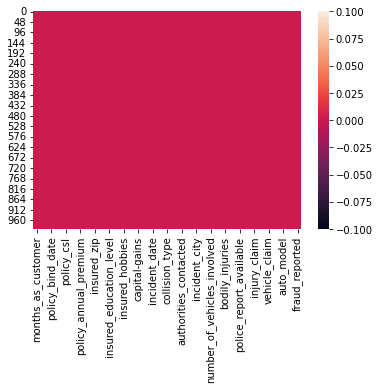

In [9]:
# Let's visualize the null values clearly through Heatmap
sns.heatmap(df.isnull())

In [10]:
# Checking the value counts of each columns
for i in df.columns:
        print(df[i].value_counts())
        print('*'*60)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
************************************************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
************************************************************
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
************************************************************
OH

Checking the number of rows covered by all the unique values present in our object data type columns. My observations from this are:

•	policy_bind_date has date related data

•	incident_date again has date related data


These two columns are marked as object data type but they hold date related information and will need to be handled accordingly.


Also we see rows that are filled with a "?" data in the below columns:

1.	collision_type
2.	property_damage
3.	police_report_available


So we will need to put some name inplace ? in above 3 columns.

### Feature Extraction

In [11]:
# separating the Date column into seperate day - month -  year columns using pandas Datetime method
df['policy_bind_date'] = pd.to_datetime(df['policy_bind_date'])
df['policy_bind_Day'] = df['policy_bind_date'].apply(lambda x:x.day)
df['policy_bind_Month'] = df['policy_bind_date'].apply(lambda x:x.month)
df['policy_bind_Year'] = df['policy_bind_date'].apply(lambda x:x.year)

# separating the Date column into seperate day - month -  year columns using pandas Datetime method
df['incident_date'] = pd.to_datetime(df['incident_date'])
df['incident_Day'] = df['incident_date'].apply(lambda x:x.day)
df['incident_Month'] = df['incident_date'].apply(lambda x:x.month)
df['incident_Year'] = df['incident_date'].apply(lambda x:x.year)

We have separated the date object datatype columns into 3 columns for day, month and year each.

In [12]:
# dropping the original Date columns after separating the desired outputs
df.drop(columns = ['policy_bind_date','incident_date'], axis=1, inplace=True)

In [13]:
# replacing the "?" filled rows with a meaningful name of "No-info"
df['collision_type'] = df['collision_type'].replace('?', 'No-info')
df['property_damage'] = df['property_damage'].replace('?', 'No-info')
df['police_report_available'] = df['police_report_available'].replace('?', 'No-info')

I have used the term "No-info" to replace all the "?" filled rows with a categorical name so that the representation part would look sensible and encoding will be better too.

In [14]:

df.nunique().to_frame("Unique Values")

,Unique Values
months_as_customer,391
age,46
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995
insured_sex,2
insured_education_level,7


After the addition of new columns I am taking a look at all the unique values for our columns once again and I see that column "incident_Year" has only 1 unique value filling the entire column and therefore can be dropped.

In [15]:
df.drop("incident_Year", axis=1, inplace=True)

In [48]:
df.drop("umbrella_limit", axis=1, inplace=True)

Here we have removed the 'incident_Year' column as it has only 1 value in whole dataset and also removed 'umbrella_limit' column as most of the values are zero.

In [49]:
# Let's take a look at the dataframe after preprocessing
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,328,48,OH,250/500,1000,1406.91,466132,MALE,MD,craft-repair,...,52080,Saab,92x,2004,Y,17,10,2014,25,1
1,228,42,IN,250/500,2000,1197.22,468176,MALE,MD,machine-op-inspct,...,3510,Mercedes,E400,2007,Y,27,6,2006,21,1
2,134,29,OH,100/300,2000,1413.14,430632,FEMALE,PhD,sales,...,23100,Dodge,RAM,2007,N,9,6,2000,22,2
3,256,41,IL,250/500,2000,1415.74,608117,FEMALE,PhD,armed-forces,...,50720,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10
4,228,44,IL,500/1000,1000,1583.91,610706,MALE,Associate,sales,...,4550,Accura,RSX,2009,N,6,6,2014,17,2


In [51]:
df.shape

(1000, 39)

Now Let's separate the Numerical and Catagorical columns

In [18]:
Catg_data = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'object':
        Catg_data.append(x)
Catg_data

['policy_state',
 'policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [50]:
Num_data = []
for x in df.dtypes.index:
    if df.dtypes[x]!='object':
        Num_data.append(x)
Num_data

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'policy_bind_Day',
 'policy_bind_Month',
 'policy_bind_Year',
 'incident_Day',
 'incident_Month']

These are the categorical and numerical columns present in the dataset.

In [20]:
# Checking the list of counts of target
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

We have two catagories of Target data, 'Y' and 'N' which Yes and No in brief.

In [21]:
# Checking the unique values in target column
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

From the value count of the target column fraud_reported we can notice the count of the categories are different which means the data is not balanced. We will use oversampling method to balance the data before building the models

In [52]:
# Statistical summary of dataset
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,...,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,...,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,15.448000,6.559000,2001.604000,13.08400,3.407000
std,115.113174,9.140287,611.864673,244.167395,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,...,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,8.850176,3.391758,7.360391,10.44318,3.276291
min,0.000000,19.000000,500.000000,433.330000,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,...,100.00000,0.000000,0.000000,70.000000,1995.000000,1.000000,1.000000,1990.000000,1.00000,1.000000
25%,115.750000,32.000000,500.000000,1089.607500,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,...,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,8.000000,4.000000,1995.000000,2.00000,1.000000
50%,199.500000,38.000000,1000.000000,1257.200000,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,...,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,16.000000,7.000000,2002.000000,15.00000,2.000000
75%,276.250000,44.000000,2000.000000,1415.695000,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,...,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,23.000000,9.000000,2008.000000,22.00000,5.000000
max,479.000000,64.000000,2000.000000,2047.590000,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,...,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,31.000000,12.000000,2015.000000,31.00000,12.000000


Above is the Statistical information of the dataset.
From above dataset, in few columns like policy_deductable, capital-gains, injury_claim etc we can observe the mean value is greater than the median(50%) which means the data in those columns are skewed to right. And in some of the columns like total_claim_amount, vehicle_claim...etc we can observe the median is greater than the mean which means the data in the columns are skewed to left. And some of the columns have equal mean and median that means the data symmetric and is normally distributed and no skewness preaent. There is a huge difference in 75% and max it shows that huge outliers present in the columns.

## Data Visualisation

##### Univariate Analysis

Single digit category column name: fraud_reported


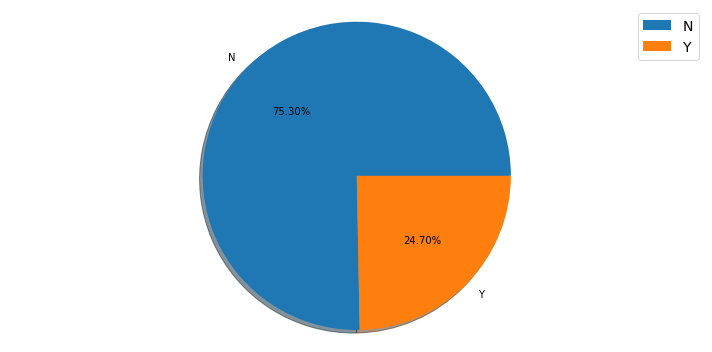

Single digit category column name: insured_sex


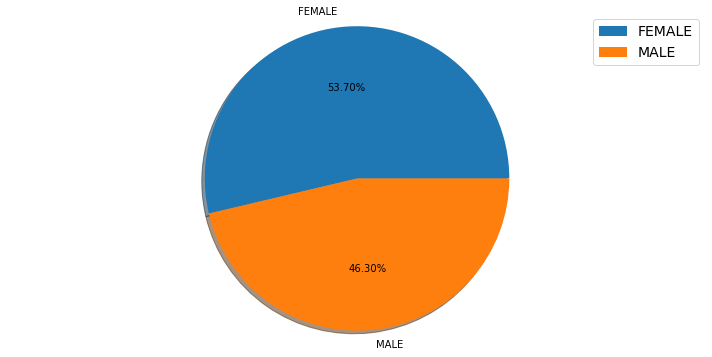

Single digit category column name: policy_state


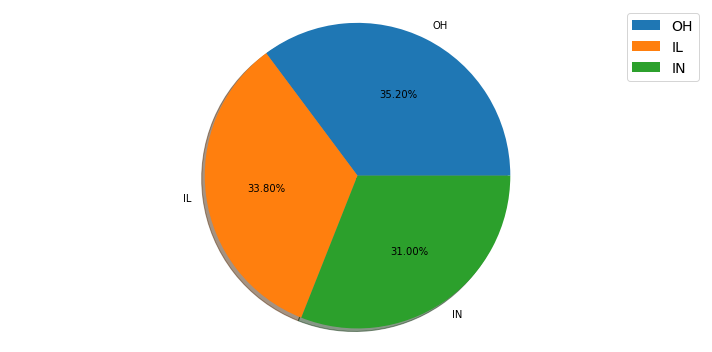

Single digit category column name: policy_csl


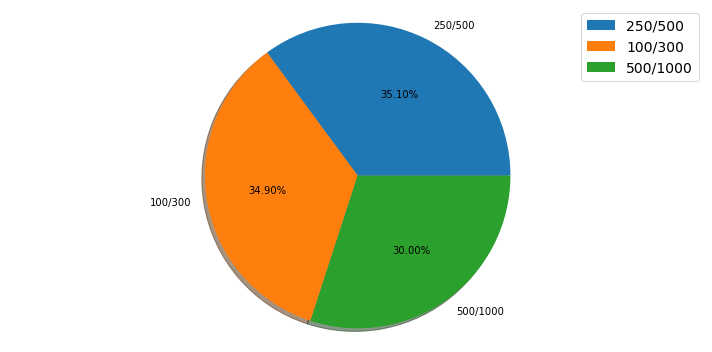

Single digit category column name: policy_deductable


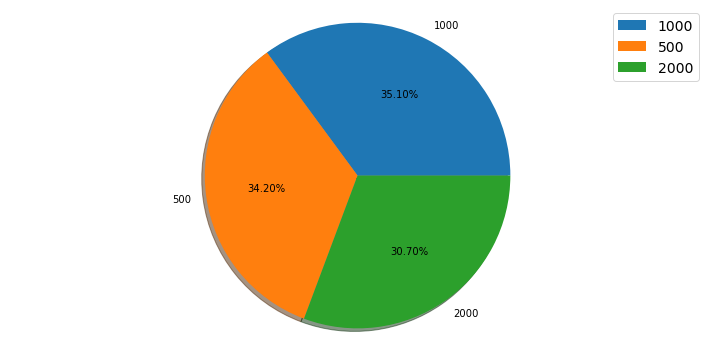

Single digit category column name: bodily_injuries


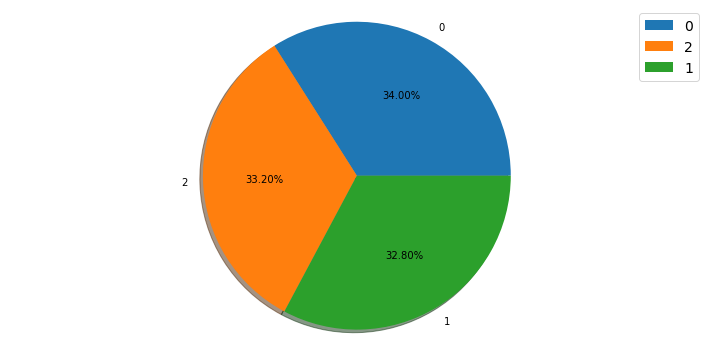

Single digit category column name: police_report_available


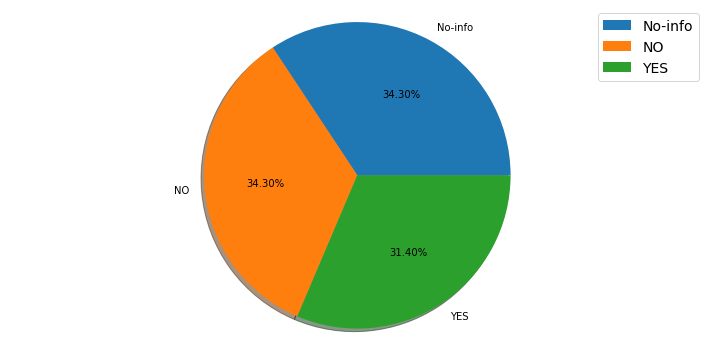

Single digit category column name: property_damage


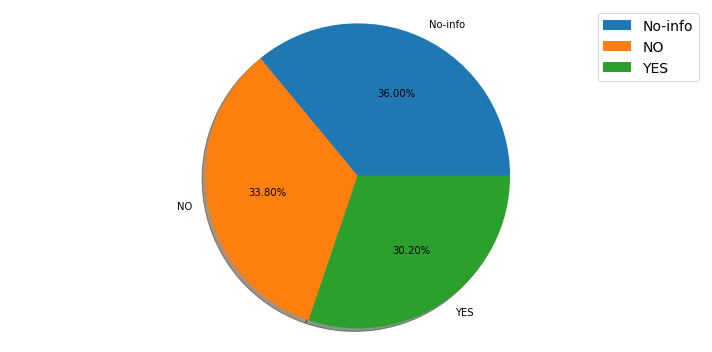

Single digit category column name: incident_type


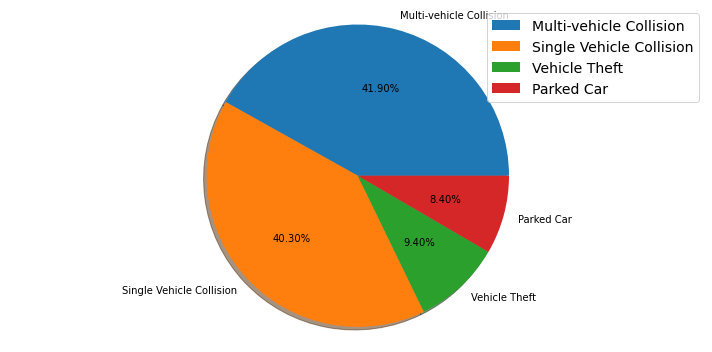

Single digit category column name: collision_type


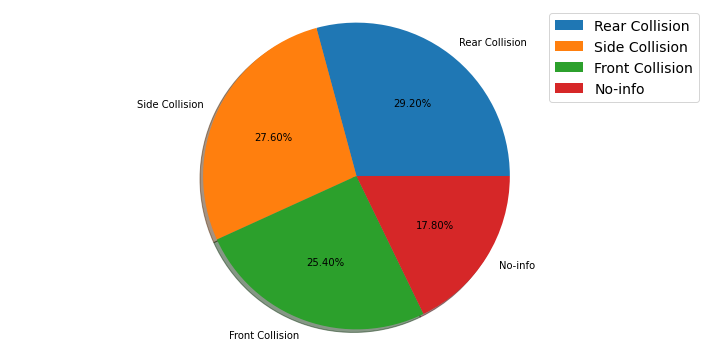

Single digit category column name: incident_severity


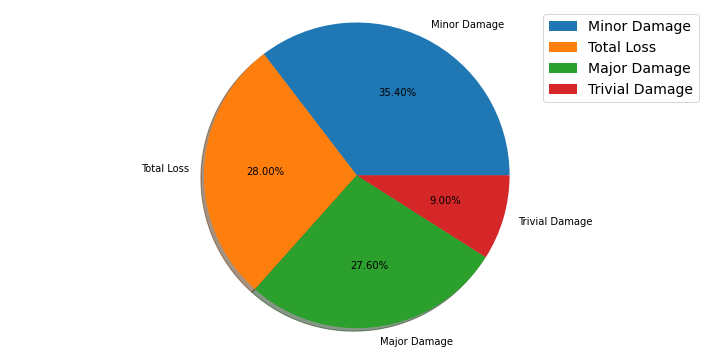

Single digit category column name: number_of_vehicles_involved


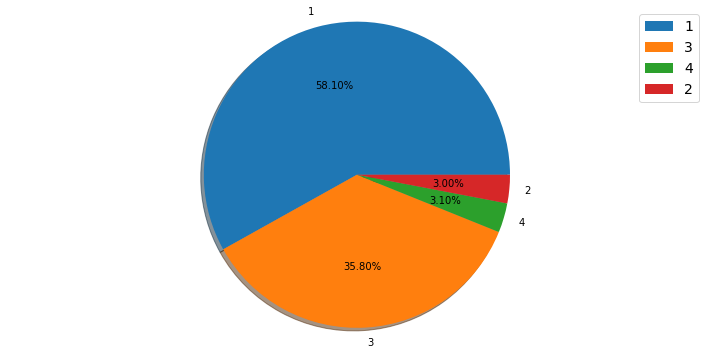

Single digit category column name: witnesses


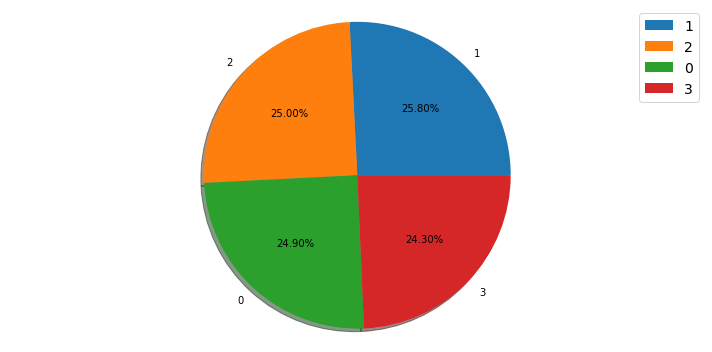

Single digit category column name: authorities_contacted


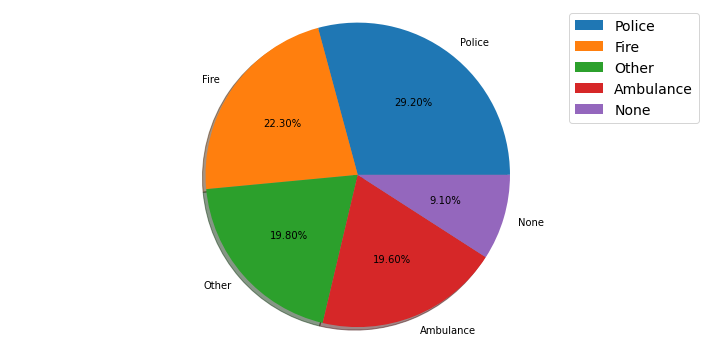

Single digit category column name: insured_relationship


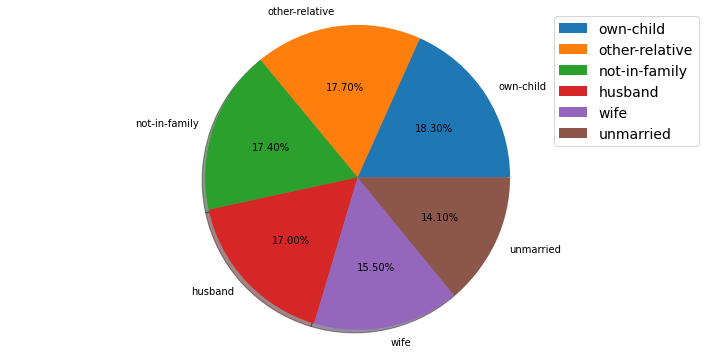

Single digit category column name: insured_education_level


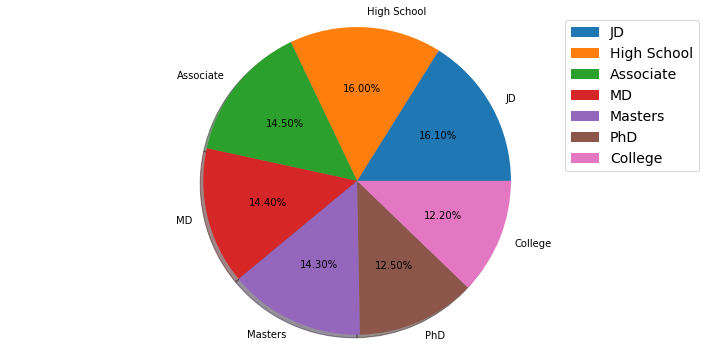

Single digit category column name: incident_state


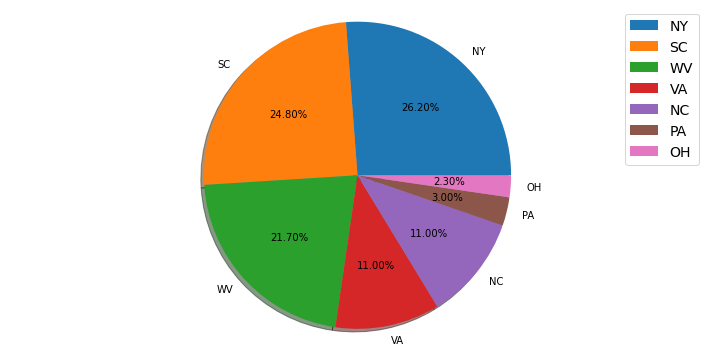

Single digit category column name: incident_city


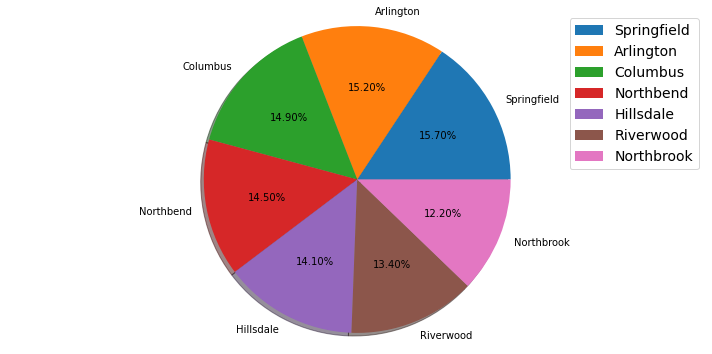

In [23]:
#Pie Plot

def generate_pie(x):
    plt.figure(figsize=(10,5))
    plt.pie(x.value_counts(), labels=x.value_counts().index, shadow=True, autopct='%1.2f%%')
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

colm = ['fraud_reported', 'insured_sex', 'policy_state', 'policy_csl', 'policy_deductable', 'bodily_injuries',
        'police_report_available', 'property_damage', 'incident_type', 'collision_type', 'incident_severity',
        'number_of_vehicles_involved', 'witnesses', 'authorities_contacted', 'insured_relationship',
        'insured_education_level', 'incident_state', 'incident_city']

for i in df[colm]:
    print(f"Single digit category column name:", i)
    generate_pie(df[i])

Above plots are for catagorical columns. 
From the above pie plots we can observe the following things:

•	Around 24.7% of the applications are reported as fraud.

•	Female insurance has more nu than Male.

•	The types of the policies claimed by the customers are almost same but still the policy state type OH has bit high counts followed by IL and IN.

•	We see that 250/500 category has a slighty higher data coverage than the 100-300 and 500/1000 categories

•	In terms of bodily injuries the severity for level 0 is slightly higher than the level 2 and 1

•	While checking for property damage data we see that 36 percent of the information is questionable while 33.80 percent people did not face any property damage so only 30.20 percent people suffered from property damage

•	For accident type, single vehicle and multi vehicle collisions have covered more than 40 percent data each and then we have 9.40 percent incidents for vehicle theft and 8.40 percent incidents for parked car

•	The count is pretty much same for all the education level but still the people who have completed their college and PhD have less count compared to others.

•	Like insured education, insured relationship is also almost equally distributed.

•	While looking at the incident type, multi-vehicle collision and Single Vehicle Collision have pretty much similar counts of around 41% and 400%. But the count is very less in Parked car and Vehicle Theft.

•	The collision type has 3 different types. In this the count is high in Rear collision and the other two types have almost equal counts.

•	As we observe the property damage plot, around 69% of the people did not face any property damage while 30% of the people faced the property damage.

•	Over 68% of the people were produced the police reports while 31% of the people didn't submit any police reports.


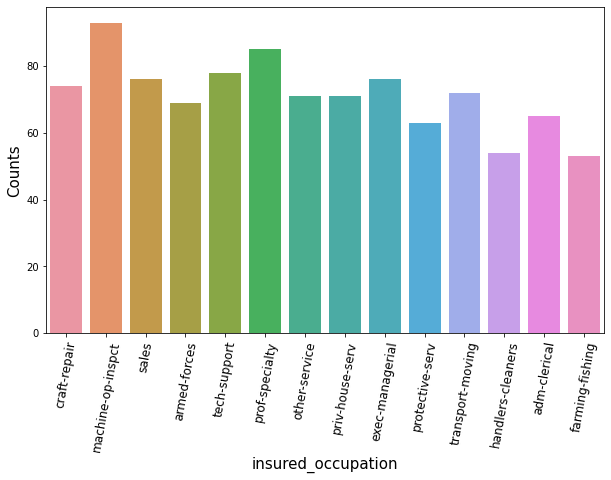

In [24]:
plt.figure(figsize=(10, 6))
sns.countplot(df['insured_occupation'])
plt.xlabel('insured_occupation', fontsize=15)
plt.ylabel('Counts', fontsize=15)
locs, labels = plt.xticks(fontsize= 12)
plt.setp(labels, rotation=80)

plt.show()

Occupation of all the insured people we see the highest data coverage by machine operation inspector and professional speciality designations

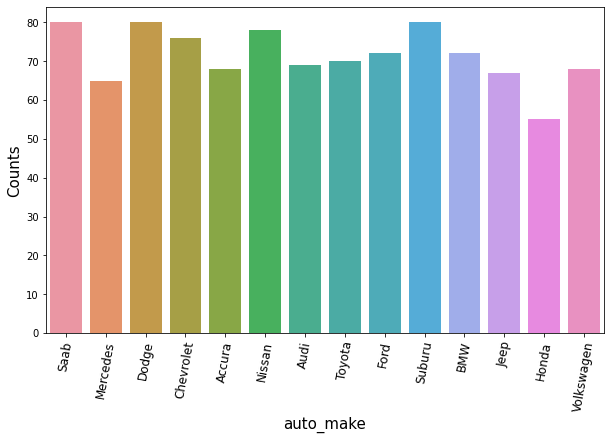

In [26]:
plt.figure(figsize=(10, 6))
sns.countplot(df['auto_make'])
plt.xlabel('auto_make', fontsize=15)
plt.ylabel('Counts', fontsize=15)
locs, labels = plt.xticks(fontsize= 12)
plt.setp(labels, rotation=80)

plt.show()

When we look at the vehicle manufactured companies, the categories Saab, Suburu, Dodge, Nissan and Volkswagen have highest counts.

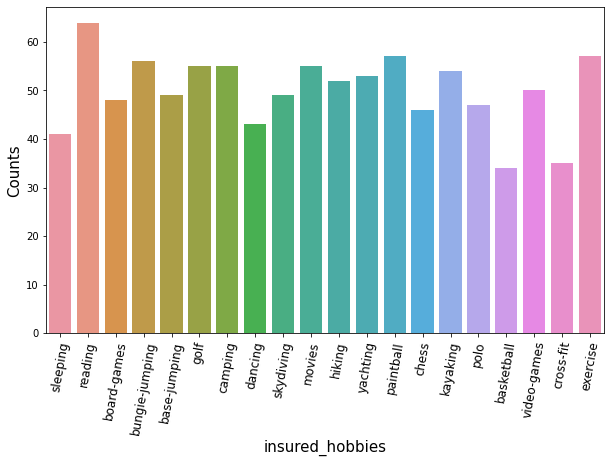

In [27]:
plt.figure(figsize=(10, 6))
sns.countplot(df['insured_hobbies'])
plt.xlabel('insured_hobbies', fontsize=15)
plt.ylabel('Counts', fontsize=15)
locs, labels = plt.xticks(fontsize= 12)
plt.setp(labels, rotation=80)

plt.show()

Maximum insured persons hobby is Reading

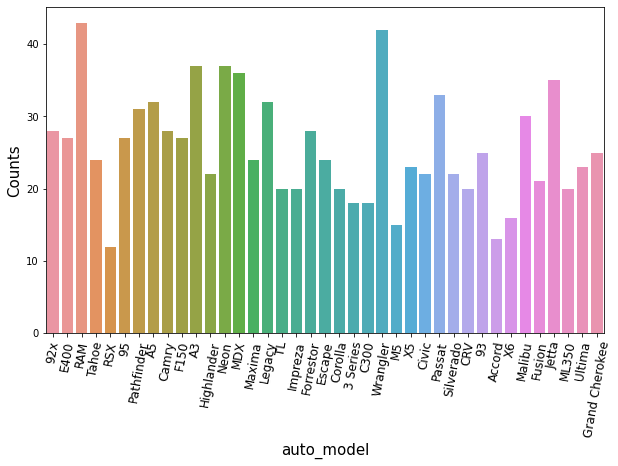

In [28]:
plt.figure(figsize=(10, 6))
sns.countplot(df['auto_model'])
plt.xlabel('auto_model', fontsize=15)
plt.ylabel('Counts', fontsize=15)
locs, labels = plt.xticks(fontsize= 12)
plt.setp(labels, rotation=80)

plt.show()

When we take a look at the vehicle models then RAM and Wrangler automobile models have highest counts and also RSX and Accord have very less count.

##### Bivariate Analysis

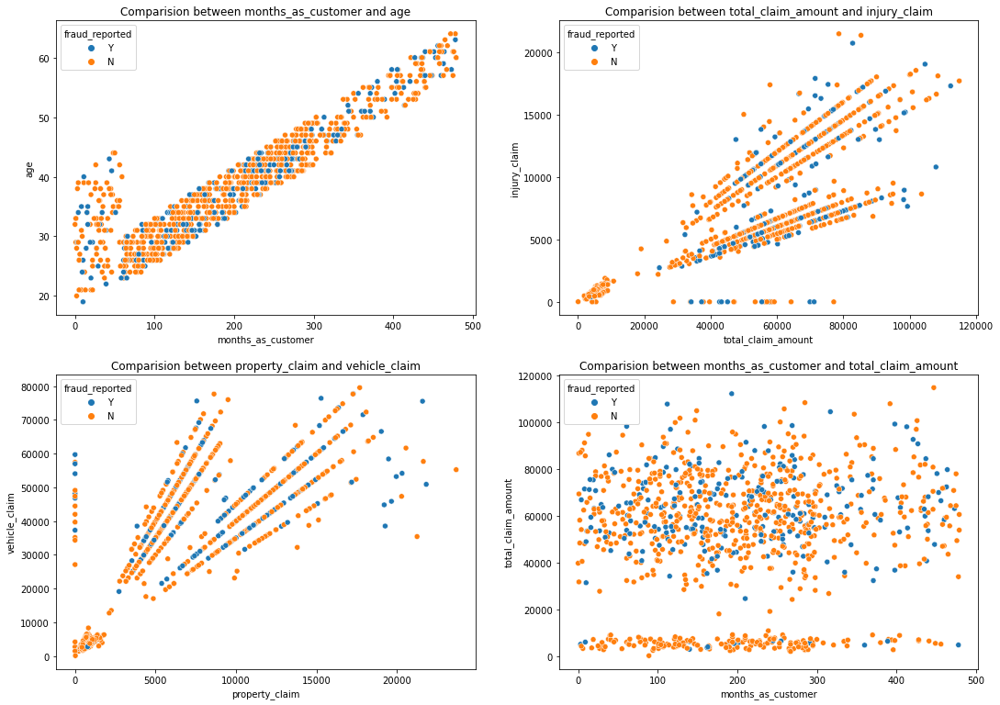

In [30]:
# Comparision between two variables
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported']);

From the above scatter plot we can observe the following things:

There is a positive linear relation between age and month_as_customer column. 

As age increases the month_as customers also increases, also the fraud reported is very less in htis case.

In the second graph we cna observe the positive linear relation, as total cliam amount increases, injury claim is also increases.

Third plot is also same as second one that is as the property claim increases, vehicle claim is also increases.

In the fourth plot we can observe the data is scattered and there is no much relation between the features.

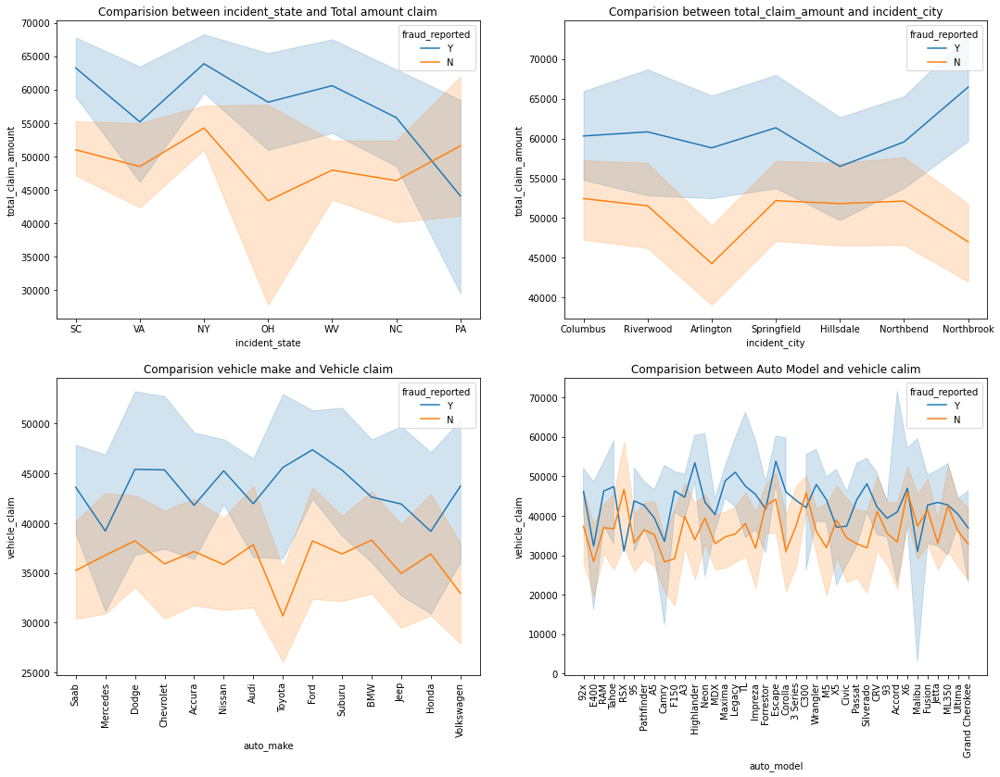

In [31]:
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between incident_state and Total amount claim')
sns.lineplot(df['incident_state'],df['total_claim_amount'],hue=df['fraud_reported'])

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and incident_city')
sns.lineplot(df['incident_city'],df['total_claim_amount'],hue=df['fraud_reported'])

plt.subplot(2,2,3)
plt.xticks(rotation=90)
plt.title('Comparision vehicle make and Vehicle claim')
sns.lineplot(df['auto_make'],df['vehicle_claim'],hue=df['fraud_reported'])

plt.subplot(2,2,4)
plt.xticks(rotation=90)
plt.title('Comparision between Auto Model and vehicle calim')
sns.lineplot(df['auto_model'],df['vehicle_claim'],hue=df['fraud_reported'])
plt.show()

From the above plot,

Almost all state if the claim amount is high then chances of fraud is also high except PA

Same in case of city high claim amount chance of fraud is high

Auto Make, Mercedes and Honda , chnces of fraud is low even if claim amount is high

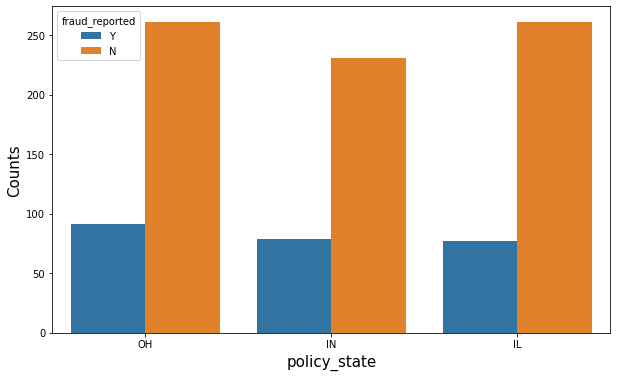

In [33]:
plt.figure(figsize=(10, 6))
sns.countplot(x='policy_state', data= df, hue='fraud_reported')
plt.xlabel('policy_state', fontsize=15)
plt.ylabel('Counts', fontsize=15)
plt.show()

We can see all the stats equally claiming the Fraud claim

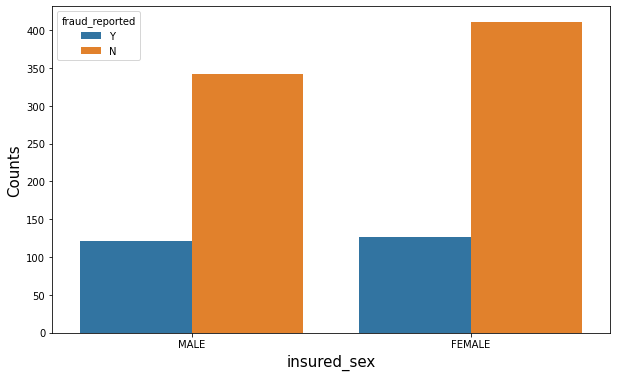

In [34]:
plt.figure(figsize=(10, 6))
sns.countplot(x='insured_sex', data= df, hue='fraud_reported')
plt.xlabel('insured_sex', fontsize=15)
plt.ylabel('Counts', fontsize=15)
plt.show()

We can see male and female both are equaly claiming the Fraud claim.

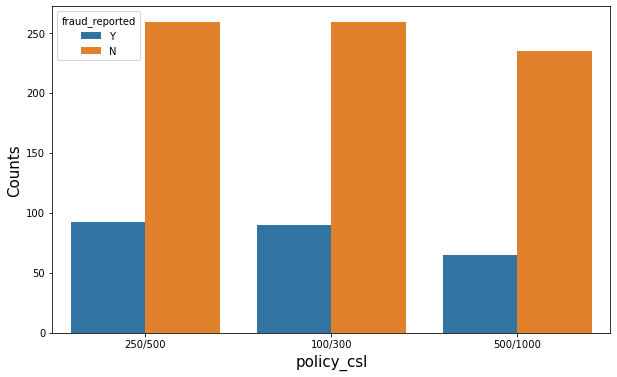

In [35]:
plt.figure(figsize=(10, 6))
sns.countplot(x='policy_csl', data= df, hue='fraud_reported')
plt.xlabel('policy_csl', fontsize=15)
plt.ylabel('Counts', fontsize=15)
plt.show()

Fraud claims are more in 250/500 and 100/300

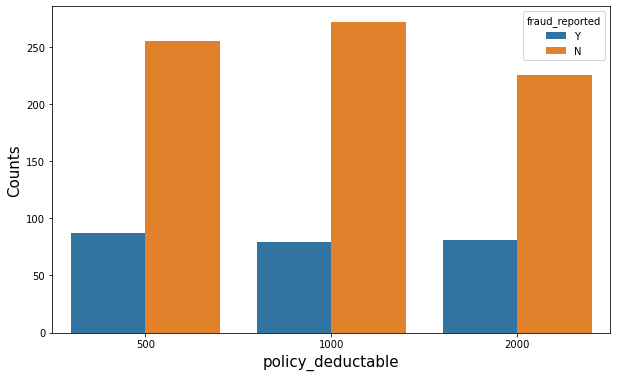

In [36]:
plt.figure(figsize=(10, 6))
sns.countplot(x='policy_deductable', data= df, hue='fraud_reported')
plt.xlabel('policy_deductable', fontsize=15)
plt.ylabel('Counts', fontsize=15)
plt.show()


In all policy_deductable Fraud claims are equal.

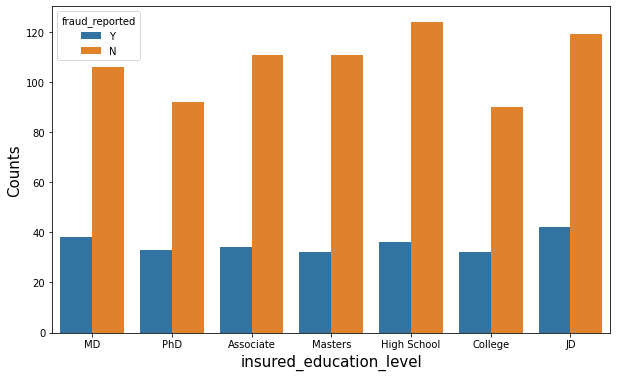

In [37]:
plt.figure(figsize=(10, 6))
sns.countplot(x='insured_education_level', data= df, hue='fraud_reported')
plt.xlabel('insured_education_level', fontsize=15)
plt.ylabel('Counts', fontsize=15)
plt.show()

We can see customers with insured_education_level as JD are more likely to claim fraud insurance

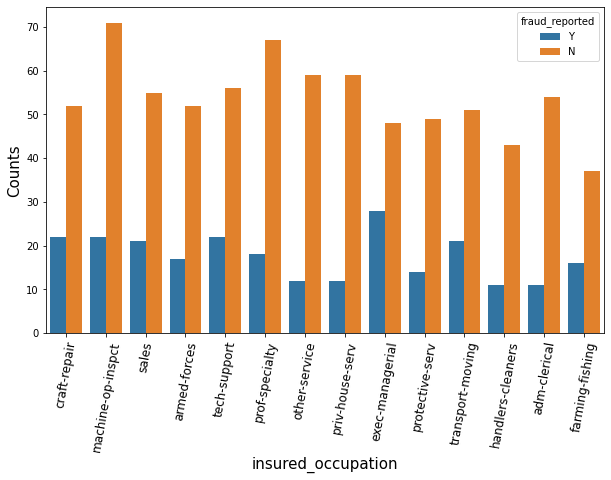

In [38]:
plt.figure(figsize=(10, 6))
sns.countplot(x='insured_occupation', data= df, hue='fraud_reported')
plt.xlabel('insured_occupation', fontsize=15)
plt.ylabel('Counts', fontsize=15)
locs, labels = plt.xticks(fontsize= 12)
plt.setp(labels, rotation=80)
plt.show()

Customers with occupation as Exec-managerial are more likely to claim fraud Insurance.

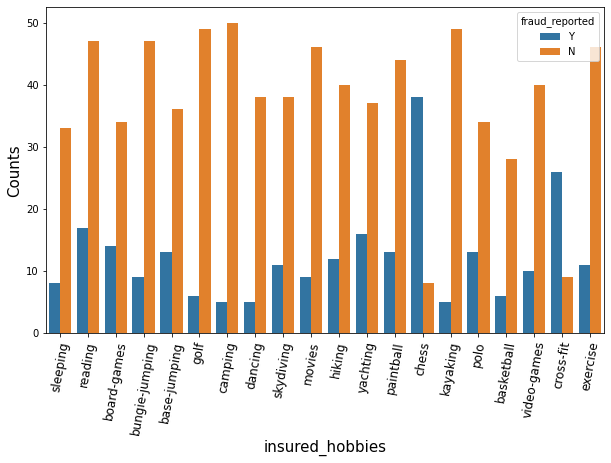

In [39]:
plt.figure(figsize=(10, 6))
sns.countplot(x='insured_hobbies', data= df, hue='fraud_reported')
plt.xlabel('insured_hobbies', fontsize=15)
plt.ylabel('Counts', fontsize=15)
locs, labels = plt.xticks(fontsize= 12)
plt.setp(labels, rotation=80)
plt.show()

Here we can see customers with hobbies as Chess player are more likely to claim fraud Insurance.

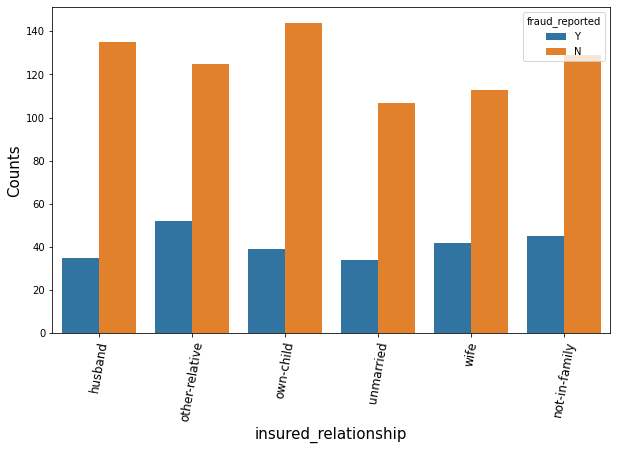

In [40]:
plt.figure(figsize=(10, 6))
sns.countplot(x='insured_relationship', data= df, hue='fraud_reported')
plt.xlabel('insured_relationship', fontsize=15)
plt.ylabel('Counts', fontsize=15)
locs, labels = plt.xticks(fontsize= 12)
plt.setp(labels, rotation=80)
plt.show()


Other Relatives and Not- in- Family are more likely to claim Fraud Insurance.

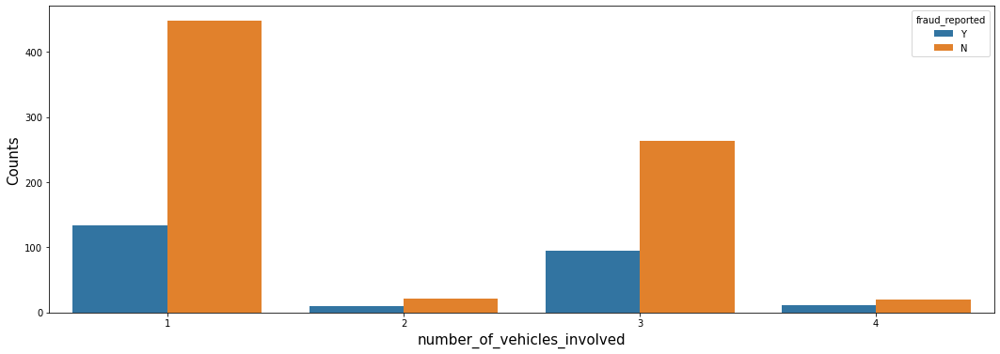

In [41]:
plt.figure(figsize=(18, 6))
sns.countplot(x='number_of_vehicles_involved', data= df, hue='fraud_reported')
plt.xlabel('number_of_vehicles_involved', fontsize=15)
plt.ylabel('Counts', fontsize=15)

plt.show()

Incident with three vehicles are more likely have Fraud claim

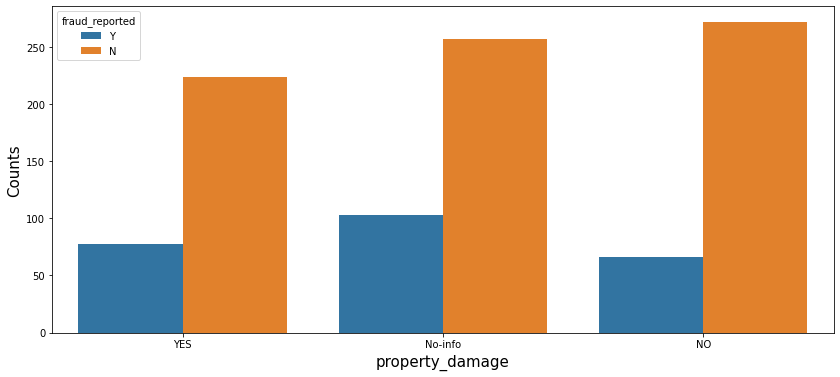

In [42]:
plt.figure(figsize=(14, 6))
sns.countplot(x='property_damage', data= df, hue='fraud_reported')
plt.xlabel('property_damage', fontsize=15)
plt.ylabel('Counts', fontsize=15)

plt.show()

Fraud claim are reported in case of No property damage.

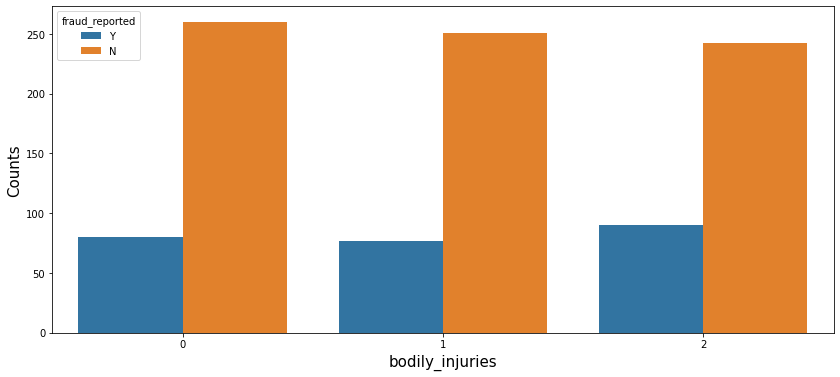

In [43]:
plt.figure(figsize=(14, 6))
sns.countplot(x='bodily_injuries', data= df, hue='fraud_reported')
plt.xlabel('bodily_injuries', fontsize=15)
plt.ylabel('Counts', fontsize=15)

plt.show()

Here we can see chances for fraud claims are equaly likely.

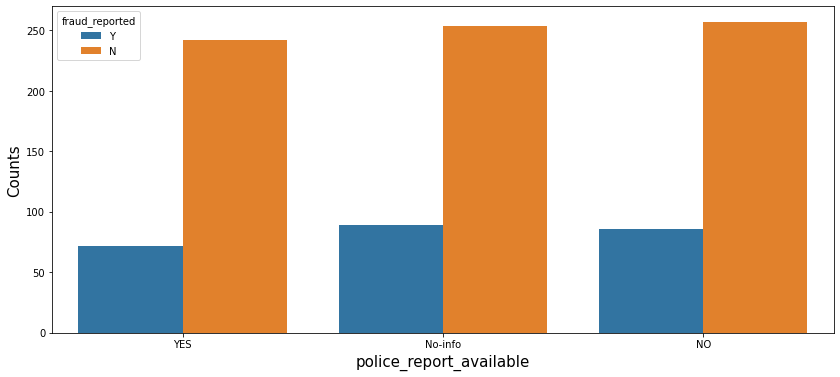

In [44]:
plt.figure(figsize=(14, 6))
sns.countplot(x='police_report_available', data= df, hue='fraud_reported')
plt.xlabel('police_report_available', fontsize=15)
plt.ylabel('Counts', fontsize=15)

plt.show()

We can see in an incident where police report is not available, chances of fraud claims Increases.

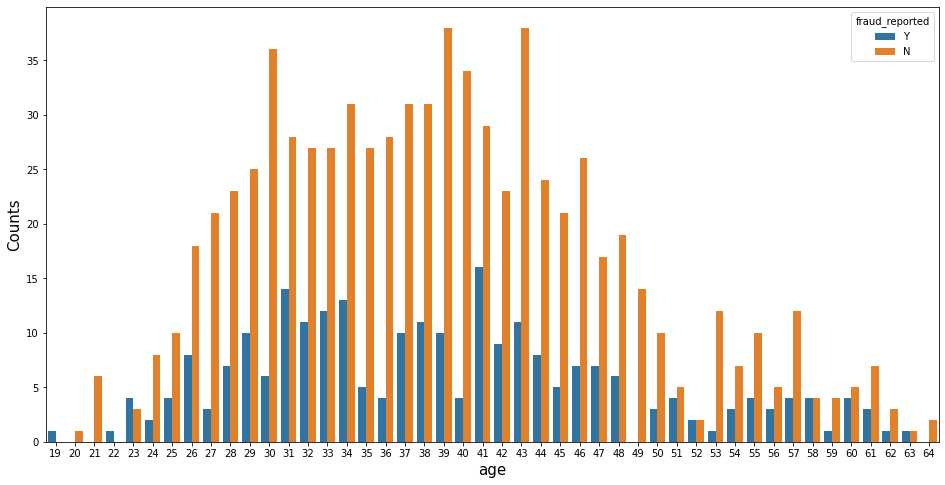

In [45]:
plt.figure(figsize=(16,8))
sns.countplot(x='age', data= df, hue='fraud_reported')
plt.xlabel('age', fontsize=15)
plt.ylabel('Counts', fontsize=15)

plt.show()

Are group 31 t0 41 are more likely to have Fraud claim.

##### Multivariate Analysis

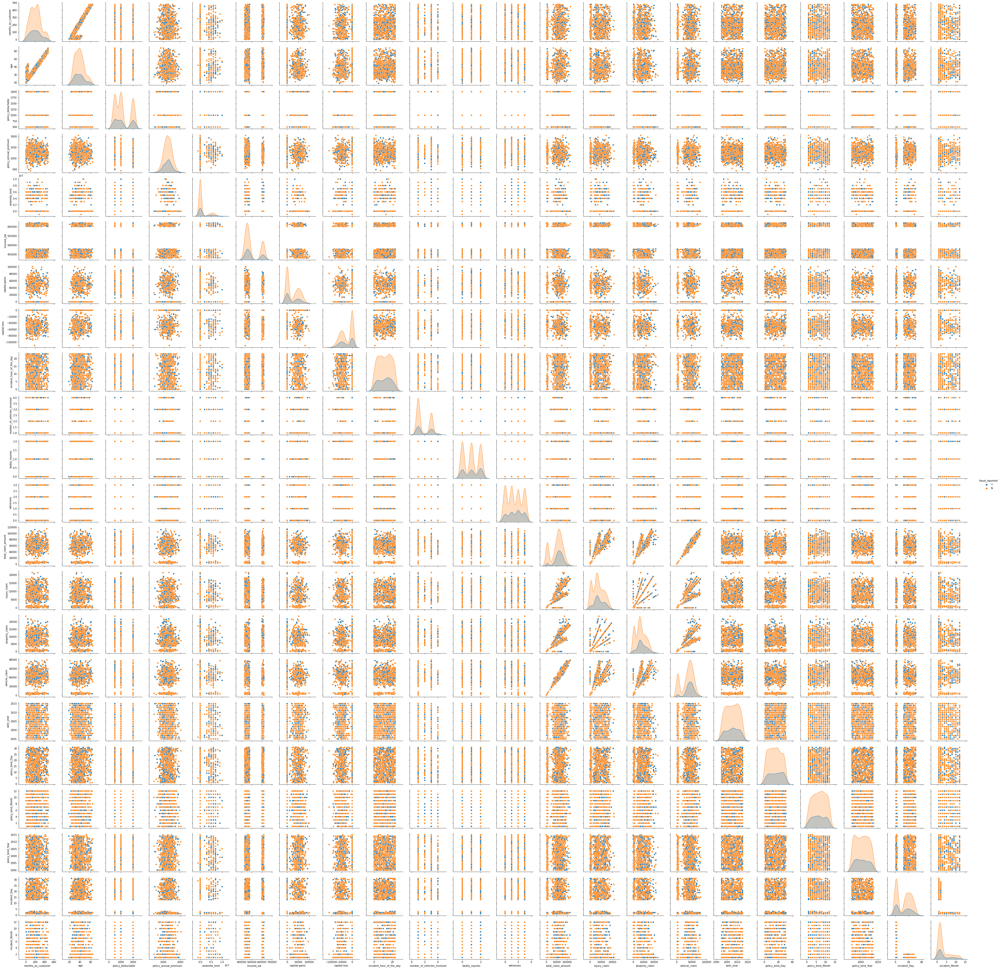

In [46]:
sns.pairplot(df,hue="fraud_reported")
plt.show()

From the above pair plot we can observe some of the features have strong correlation with each other. We ill check multicollinearity issue later.

### Outliers

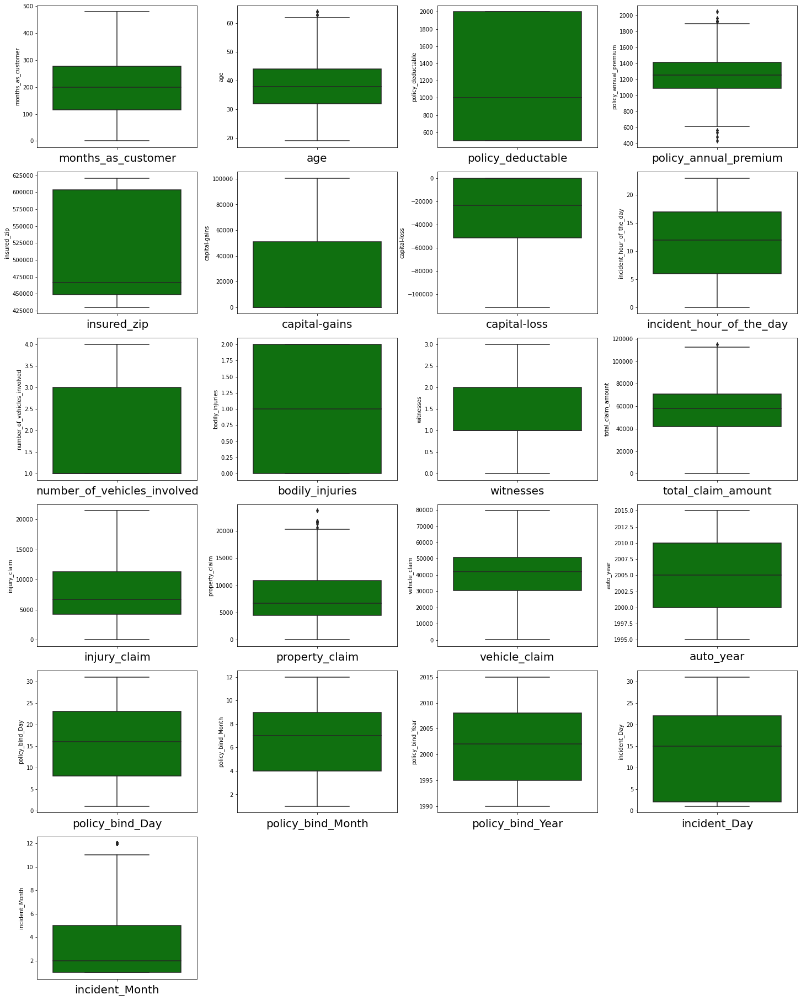

In [55]:
#Let's check the Outliers through Boxplot

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in Num_data:
    if plotnumber<=23:
        ax = plt.subplot(6,4,plotnumber)
        sns.boxplot(y=column, data=df,color='g')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=1.0)
plt.show()

We can find the outliers in the following columns:

age
policy_annual_premium
total_claim_amount
property_claim
incident_month
These are the numerical columns which contains outliers. Let's remove outliers in these columns using Zscore method.

#### Removing outliers using Zscore

In [56]:
# Features containing outliers
df1 = df[['age','policy_annual_premium','total_claim_amount','property_claim','incident_Month']]

In [57]:
# Using zscore to remove outliers in the feature newpaper
from scipy.stats import zscore

z=np.abs(zscore(df1))

# Creating new dataframe
new_df=df[(z<3).all(axis=1)]
new_df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,328,48,OH,250/500,1000,1406.91,466132,MALE,MD,craft-repair,...,52080,Saab,92x,2004,Y,17,10,2014,25,1
1,228,42,IN,250/500,2000,1197.22,468176,MALE,MD,machine-op-inspct,...,3510,Mercedes,E400,2007,Y,27,6,2006,21,1
2,134,29,OH,100/300,2000,1413.14,430632,FEMALE,PhD,sales,...,23100,Dodge,RAM,2007,N,9,6,2000,22,2
3,256,41,IL,250/500,2000,1415.74,608117,FEMALE,PhD,armed-forces,...,50720,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10
4,228,44,IL,500/1000,1000,1583.91,610706,MALE,Associate,sales,...,4550,Accura,RSX,2009,N,6,6,2014,17,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,431289,FEMALE,Masters,craft-repair,...,61040,Honda,Accord,2006,N,16,7,1991,22,2
996,285,41,IL,100/300,1000,1436.79,608177,FEMALE,PhD,prof-specialty,...,72320,Volkswagen,Passat,2015,N,1,5,2014,24,1
997,130,34,OH,250/500,500,1383.49,442797,FEMALE,Masters,armed-forces,...,52500,Suburu,Impreza,1996,N,17,2,2003,23,1
998,458,62,IL,500/1000,2000,1356.92,441714,MALE,Associate,handlers-cleaners,...,36540,Audi,A5,1998,N,18,11,2011,26,2


In [58]:
df.shape

(1000, 39)

In [59]:
new_df.shape

(996, 39)

In [60]:
# Let's check the the data loss
data_loss = (1000-996)/1000*100
data_loss

0.4

Very less amount of data is loss.

In [61]:
df=new_df.copy() # Reassigning the changed dataframe name to our original dataframe name

### Skewness

In [62]:
# Checking the skewness
df.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
insured_zip                    0.825568
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.619755
auto_year                     -0.049276
policy_bind_Day                0.028923
policy_bind_Month             -0.029722
policy_bind_Year               0.058499
incident_Day                   0.055659
incident_Month                 1.377097
dtype: float64

The following features contains the skewness based on the acceptable range of +/-0.5 value.

insured_zip
total_claim_amount
vehicle_claim
incident_Month


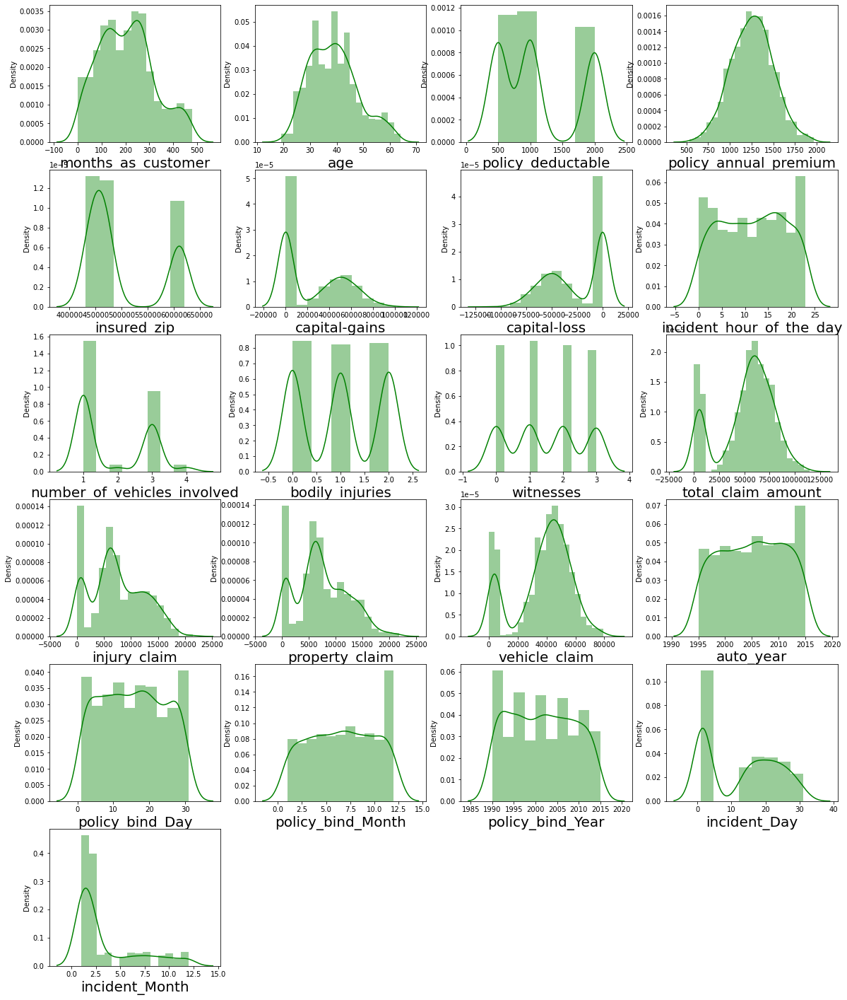

In [63]:
#Checking the skewness through Dist plot

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in Num_data:
    if plotnumber<=23:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color='g')
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

#### Removing skewness through yeo-johnson

In [64]:
# Removing skewness using yeo-johnson  method to get better prediction
skew = ["insured_zip","total_claim_amount","vehicle_claim","incident_Month"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [65]:
df[skew] = scaler.fit_transform(df[skew].values)
df[skew].head()

,insured_zip,total_claim_amount,vehicle_claim,incident_Month
0,0.0,0.717556,0.754553,-1.101370
1,0.0,-1.777785,-1.787353,-1.101370
2,0.0,-0.716483,-0.820820,-0.026479
3,0.0,0.392931,0.678427,1.553647
4,0.0,-1.730555,-1.740710,-0.026479


In [66]:
# Checking the skewness after power transform
df.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
insured_zip                    0.000000
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.508953
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.521354
auto_year                     -0.049276
policy_bind_Day                0.028923
policy_bind_Month             -0.029722
policy_bind_Year               0.058499
incident_Day                   0.055659
incident_Month                 0.305741
dtype: float64

Let's drop the column 'insured_zip' as it has zero values.

In [71]:
df.drop("insured_zip", axis=1, inplace=True)

### Encoding

##### Encoing Catagorical data using Label Encoding

In [67]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df[Catg_data]= df[Catg_data].apply(le.fit_transform)

In [68]:
df[Catg_data]

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,1,4,2,17,0,2,3,0,4,4,1,2,2,10,1,1
1,1,1,1,4,6,15,2,3,1,1,4,5,5,1,1,8,12,1
2,2,0,0,6,11,2,3,0,2,1,4,1,1,0,0,4,30,0
3,0,1,0,6,1,2,4,2,0,0,4,2,0,1,0,3,34,1
4,0,2,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,2,0,5,2,13,4,2,0,1,1,0,4,2,1,6,6,0
996,0,0,0,6,9,17,5,2,2,0,1,4,3,2,1,13,28,0
997,2,1,0,5,1,3,2,0,3,1,4,0,0,1,2,11,19,0
998,0,2,1,0,5,0,5,2,2,0,3,1,0,1,2,1,5,0


### Correlation

In [72]:
# Checking the correlation between features and the target
cor = df.corr()
cor

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
months_as_customer,1.000000,0.922092,0.000118,-0.022964,0.023512,-0.003378,0.059002,-0.000848,0.005365,-0.092575,...,0.062392,0.049222,0.002908,0.001287,0.020966,0.054175,0.004955,-0.046010,-0.013502,0.019029
age,0.922092,1.000000,-0.015182,-0.012429,0.026772,0.005890,0.072900,0.001485,0.014030,-0.080587,...,0.062165,0.032105,0.016258,0.003268,0.012408,0.054465,0.015874,-0.035505,-0.008174,0.016685
policy_state,0.000118,-0.015182,1.000000,-0.000349,0.010740,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,...,-0.000472,0.015848,-0.024513,0.002323,0.028864,0.001030,0.071527,-0.005709,0.013370,0.026233
policy_csl,-0.022964,-0.012429,-0.000349,1.000000,0.006149,0.030864,-0.008369,0.010380,0.019598,-0.007445,...,-0.046891,-0.006565,0.048351,-0.034893,-0.038795,0.016531,-0.044653,-0.017664,-0.003879,-0.043747
policy_deductable,0.023512,0.026772,0.010740,0.006149,1.000000,-0.008445,-0.011671,0.014571,-0.050024,0.005134,...,0.005902,-0.034266,-0.003597,0.027497,0.015833,0.011204,-0.051368,-0.048465,-0.018867,-0.000169
policy_annual_premium,-0.003378,0.005890,0.014475,0.030864,-0.008445,1.000000,0.041830,-0.021475,0.030963,-0.014376,...,0.012961,0.011595,-0.034998,-0.040439,-0.010174,-0.030886,-0.028452,0.001650,0.016400,-0.012386
insured_sex,0.059002,0.072900,-0.019294,-0.008369,-0.011671,0.041830,1.000000,0.007473,-0.009257,-0.019600,...,-0.026816,0.026040,-0.017679,-0.028638,0.032173,0.045694,-0.007259,-0.031981,-0.007249,0.024223
insured_education_level,-0.000848,0.001485,-0.032551,0.010380,0.014571,-0.021475,0.007473,1.000000,-0.021502,0.022806,...,0.070001,0.057528,0.050878,0.045094,0.011520,0.014464,-0.007489,0.017801,-0.055411,0.069312
insured_occupation,0.005365,0.014030,-0.031016,0.019598,-0.050024,0.030963,-0.009257,-0.021502,1.000000,-0.009818,...,0.000954,0.044321,0.020878,-0.004827,0.003335,-0.003030,0.024516,-0.025282,-0.022786,0.013226
insured_hobbies,-0.092575,-0.080587,-0.040215,-0.007445,0.005134,-0.014376,-0.019600,0.022806,-0.009818,1.000000,...,-0.015968,-0.000055,0.031208,-0.015606,-0.047983,0.028387,-0.005233,-0.013819,0.014295,-0.001239


Positive correlation - A correlation of +1 indicates a perfect positive correlation, meaning that both variables move in the same direction together.

Negative correlation - A correlation of –1 indicates a perfect negative correlation, meaning that as one variable goes up, the other goes down.

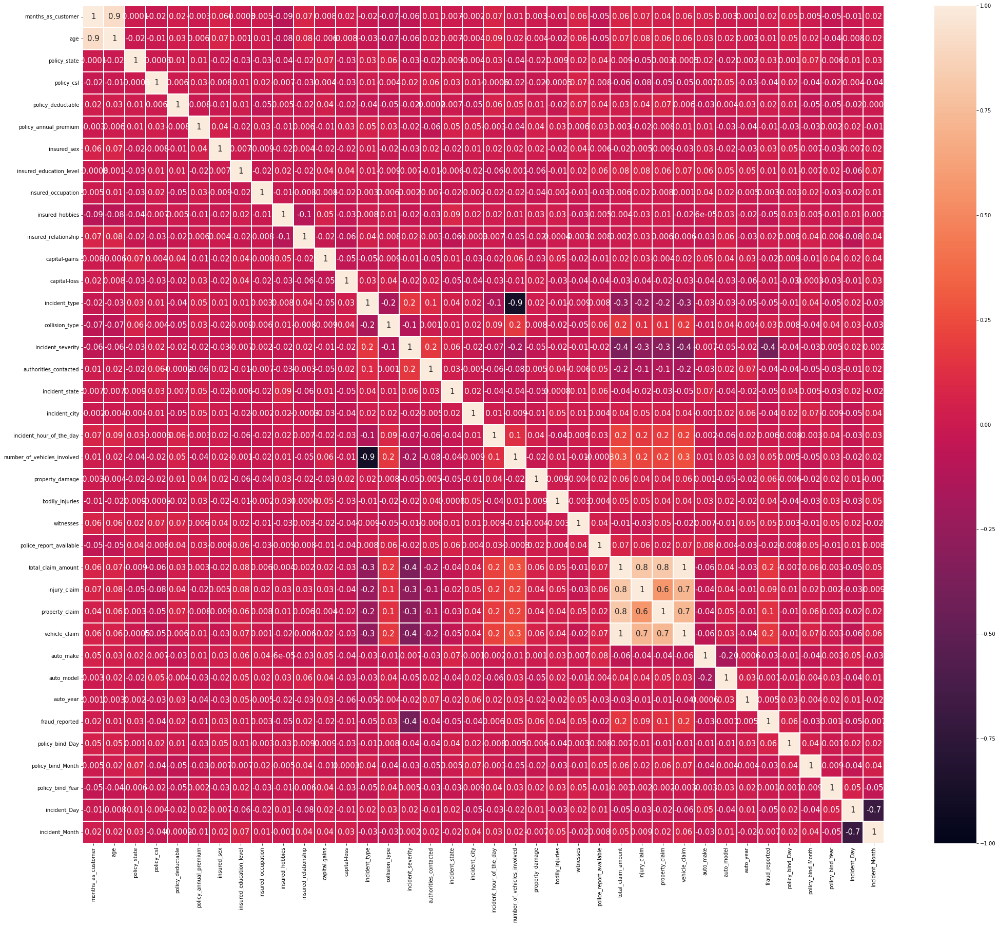

In [73]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(35,30))
sns.heatmap(df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, annot_kws={'size':15})
plt.yticks(rotation=0);

The above heat map contains both positive and negative correlation.

There is very less correlation between the target and the label.
We can observe the most of the columns are highly correlated with each other which leads to the multicollinearity problem.
We will check the VIF value to overcome with this multicollinearity problem.

##### Visualizing the correlation between label and features using bar plot

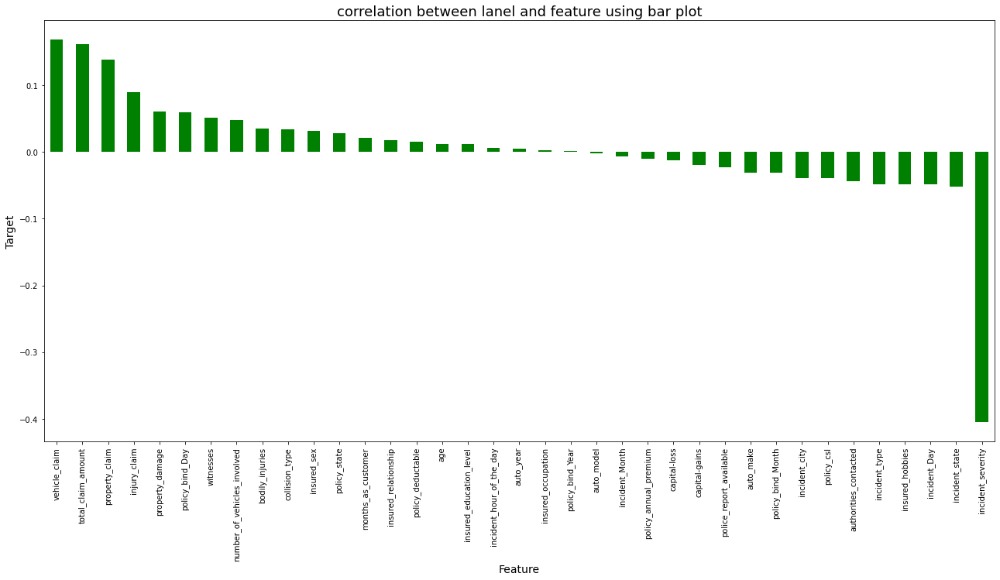

In [75]:
plt.figure(figsize=(22,10))
df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between lanel and feature using bar plot',fontsize=18)
plt.show()

From the above bar plot we can observe that the columns policy_bind_Year, insured_occupation and auto_model are very less correlated with the target. We can drop this columns if necessary.

### Separating the independent and target variables into x and y

In [76]:
x = df.drop("fraud_reported", axis=1)
y = df["fraud_reported"]

In [77]:
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

As the target variable is imbalanced, let's balance it through Oversampling method

### Oversampling

In [78]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [79]:
y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

Our Target vaiable is now balanced.

### Scaling data with standard scaler

In [80]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,1.109836,1.035358,1.368100,0.230368,-0.243586,0.669089,1.257679,0.639988,-1.220953,1.421482,...,1.132610,0.705366,0.996715,-1.730503,-0.189061,0.155376,1.116395,1.806472,1.264705,-1.145093
1,0.206188,0.352454,0.114496,0.230368,1.468889,-0.261391,1.257679,0.639988,-0.152753,1.046553,...,-1.549723,-2.108834,0.465511,-0.680247,0.334816,1.337244,-0.126115,0.645936,0.858331,-1.145093
2,-0.643241,-1.127171,1.368100,-1.078539,1.468889,0.696734,-0.795116,1.730257,1.182498,-1.390488,...,-0.876948,-1.038764,-0.596896,1.038353,0.334816,-0.790118,-0.126115,-0.224467,0.959924,-0.018024
3,0.459210,0.238637,-1.139109,0.230368,1.468889,0.708271,-0.795116,1.730257,-1.488003,-1.390488,...,-0.331278,0.621085,-0.862497,1.420264,1.557196,1.100870,-0.436742,-1.675138,-1.173542,1.638806
4,0.206188,0.580089,-1.139109,1.539274,-0.243586,1.454510,1.257679,-1.540550,1.182498,-1.390488,...,-1.578212,-2.057194,-1.659303,1.133831,0.684067,-1.144678,-0.126115,1.806472,0.451956,-0.018024


This is our scaled data using standard scaler.

### Variance Inflation Factor(VIF)

In [81]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,7.269992,months_as_customer
1,7.207291,age
2,1.066941,policy_state
3,1.076005,policy_csl
4,1.051454,policy_deductable
5,1.040494,policy_annual_premium
6,1.067600,insured_sex
7,1.051372,insured_education_level
8,1.034727,insured_occupation
9,1.064901,insured_hobbies


We can observe some columns have VIF above 10 that means they are causing multicollinearity problem.

total_claim amount,
injury_claim,
property_claim,
vehicle_claim

Let's drop the feature having high VIF value amongst all the columns.

In [82]:
# Dropping total_claim_amount column as it contains high VIF value
x.drop(["total_claim_amount"],axis=1,inplace=True)

In [83]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(x.values, i) 
                     for i in range(x.shape[1])]
vif["Features"]=x.columns
vif

,vif_Features,Features
0,7.257456,months_as_customer
1,7.202898,age
2,1.066907,policy_state
3,1.075834,policy_csl
4,1.051438,policy_deductable
5,1.039399,policy_annual_premium
6,1.063875,insured_sex
7,1.051302,insured_education_level
8,1.031957,insured_occupation
9,1.064631,insured_hobbies


Now the VIF value is less than 10 for all columns, so there is no multicollinireaty issue. We can now proceede for modelling.

## Modeling

#### Finding best random state

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

In [87]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred = RFC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9066666666666666  on Random_state  78


Here we are getting accuracy score of 90.66% with Random state 78

Now splitting the data for Training and Testing purpose. 70% we are considering for Training and 30% for Testing purpose

In [89]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

### Random Forest Classifier

In [90]:
# Checking accuracy score for Random Forest Classifier
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)

# Prediction
predRFC = RFC.predict(x_test)

print(accuracy_score(y_test, predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

0.9155555555555556
[[214  20]
 [ 18 198]]
              precision    recall  f1-score   support

           0       0.92      0.91      0.92       234
           1       0.91      0.92      0.91       216

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



### Support Vector Machine Classifier

In [91]:
# Checking accuracy score for Support Vector Machine Classifier
svc = SVC()
svc.fit(x_train,y_train)

# Prediction
predsvc = svc.predict(x_test)

print(accuracy_score(y_test, predsvc))
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test,predsvc))

0.8688888888888889
[[211  23]
 [ 36 180]]
              precision    recall  f1-score   support

           0       0.85      0.90      0.88       234
           1       0.89      0.83      0.86       216

    accuracy                           0.87       450
   macro avg       0.87      0.87      0.87       450
weighted avg       0.87      0.87      0.87       450



### Gradient Boosting Classifier

In [92]:
# Checking accuracy score for Gradient Boosting Classifier
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)

# Prediction
predGB = GB.predict(x_test)

print(accuracy_score(y_test, predGB))
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test,predGB))

0.8955555555555555
[[213  21]
 [ 26 190]]
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       234
           1       0.90      0.88      0.89       216

    accuracy                           0.90       450
   macro avg       0.90      0.89      0.90       450
weighted avg       0.90      0.90      0.90       450



### AdaBoost Classifier

In [93]:
# Checking accuracy score for AdaBoost Classifier
ABC = AdaBoostClassifier()
ABC.fit(x_train,y_train)

# Prediction
predABC = ABC.predict(x_test)

print(accuracy_score(y_test, predABC))
print(confusion_matrix(y_test, predABC))
print(classification_report(y_test,predABC))

0.8733333333333333
[[214  20]
 [ 37 179]]
              precision    recall  f1-score   support

           0       0.85      0.91      0.88       234
           1       0.90      0.83      0.86       216

    accuracy                           0.87       450
   macro avg       0.88      0.87      0.87       450
weighted avg       0.88      0.87      0.87       450



### Bagging Classifier

In [94]:
# Checking accuracy for BaggingClassifier
BC = BaggingClassifier()
BC.fit(x_train,y_train)

# Prediction
predBC = BC.predict(x_test)

print(accuracy_score(y_test, predBC))
print(confusion_matrix(y_test, predBC))
print(classification_report(y_test,predBC))

0.8733333333333333
[[213  21]
 [ 36 180]]
              precision    recall  f1-score   support

           0       0.86      0.91      0.88       234
           1       0.90      0.83      0.86       216

    accuracy                           0.87       450
   macro avg       0.88      0.87      0.87       450
weighted avg       0.87      0.87      0.87       450



### Extra Trees Classifier

In [95]:
# Checking accuracy for ExtraTreesClassifier
XT = ExtraTreesClassifier()
XT.fit(x_train,y_train)

# Prediction
predXT = XT.predict(x_test)


print(accuracy_score(y_test, predXT))
print(confusion_matrix(y_test, predXT))
print(classification_report(y_test,predXT))

0.9066666666666666
[[213  21]
 [ 21 195]]
              precision    recall  f1-score   support

           0       0.91      0.91      0.91       234
           1       0.90      0.90      0.90       216

    accuracy                           0.91       450
   macro avg       0.91      0.91      0.91       450
weighted avg       0.91      0.91      0.91       450



### XGB Classifier

In [96]:
# Checking accuracy for XGBClassifier
XGB = xgb(verbosity=0)
XGB.fit(x_train,y_train)

# Prediction
predXGB = XGB.predict(x_test)

print(accuracy_score(y_test, predXGB))
print(confusion_matrix(y_test, predXGB))
print(classification_report(y_test,predXGB))

0.8977777777777778
[[212  22]
 [ 24 192]]
              precision    recall  f1-score   support

           0       0.90      0.91      0.90       234
           1       0.90      0.89      0.89       216

    accuracy                           0.90       450
   macro avg       0.90      0.90      0.90       450
weighted avg       0.90      0.90      0.90       450



#### Checking the cross validation score

In [97]:
from sklearn.model_selection import cross_val_score

In [98]:
# cv score for Random Forest Classifier
print(cross_val_score(RFC,x,y,cv=5).mean())

0.8633333333333333


In [99]:
# cv score for Support Vector  Classifier
print(cross_val_score(svc,x,y,cv=5).mean())

0.8240000000000001


In [100]:
# cv score for Gradient Boosting Classifier
print(cross_val_score(GB,x,y,cv=5).mean())

0.8626666666666667


In [101]:
# cv score for AdaBoosting Classifier
print(cross_val_score(ABC,x,y,cv=5).mean())

0.8400000000000001


In [102]:
# cv score for Bagging Classifier
print(cross_val_score(BC,x,y,cv=5).mean())

0.8433333333333334


In [103]:
# cv score for Extra Trees Classifier
print(cross_val_score(XT,x,y,cv=5).mean())

0.86


In [104]:
# cv score for XGB Classifier
print(cross_val_score(XGB,x,y,cv=5).mean())

0.8706666666666667


From the above observation, looking at the accuracy score and the cross validation score we conclude that XGB Classifier is our best fitting model

### Hyper Parameter Tuning

In [105]:
from sklearn.model_selection import GridSearchCV

In [106]:
#XGB Classifier
parameters = {'n_estimators' : [50,100,200,400],
              'gamma' : np.arange(0,0.5,0.1),
              'max_depth' : [4, 6, 8,10],
              'n_jobs' : [-2, -1, 1]}

In [108]:
GCV=GridSearchCV(xgb(),parameters,cv=5)

In [109]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_ca...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                  

In [110]:
GCV.best_params_

{'gamma': 0.0, 'max_depth': 4, 'n_estimators': 100, 'n_jobs': -2}

In [112]:
Final_Model = xgb(gamma=0.0, max_depth=4, n_estimators=100, n_jobs=-2)
Final_Model.fit(x_train, y_train)
pred = Final_Model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

90.22222222222223


After Hyperparameter Tuning, accuracy score is 90.22%

### Plotting ROC-AUC curve

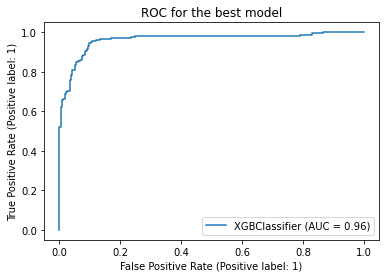

In [113]:
# Let's check the Auc for the best model after hyper parameter tuning
from sklearn.metrics import plot_roc_curve 

plot_roc_curve(Final_Model, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

Here I have generated the ROC Curve for final model and it shows the AUC score for my final model 96%

## Saving The Model

In [114]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_Model,"Insuranceclaims_FraudDetection.pkl")

['Insuranceclaims_FraudDetection.pkl']

#### Predicting the saved model

In [115]:
# Loading the saved model
model=joblib.load("Insuranceclaims_FraudDetection.pkl")

#Prediction
prediction = model.predict(x_test)
a = np.array(y_test)
df_final = pd.DataFrame({"Original":a,"Predicted":prediction},index=range(len(a)))
df_final

,Original,Predicted
0,0,0
1,1,1
2,0,0
3,1,1
4,1,1
...,...,...
445,1,1
446,0,0
447,0,0
448,0,0


# Conclusion

We have sucessfully created a predictive model for auto insurance claim fraud detection using Classification technique. XGB Classification technique works best for our dataset.

# Thank You !